<a href="https://colab.research.google.com/github/JoelmirDias/Trabalho/blob/main/Arraste_Dessalgadora.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estudo do arraste na dessalgadora da U200A

### Task 1: Import Libraries
---

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 21.9 MB 138 kB/s
     |████████████████████████████████| 102 kB 14.0 MB/s 
     |████████████████████████████████| 690 kB 69.9 MB/s 
     |████████████████████████████████| 4.7 MB 71.5 MB/s 
     |████████████████████████████████| 62 kB 1.0 MB/s 
     |████████████████████████████████| 812 kB 40.8 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=261257 sha256=02e873579ff35ae12bb4dc4d2054f665154548792d469b01ecaacc6cdc0b95f7
  Stored in directory: /tmp/pip-ephem-wheel-cache-a6dzu6sr/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=329bd59a35e9553de2a17e9f7ed534ef2fc24a6c3b1bbc97bc9a2cc078272b6c
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehas

In [2]:
from __future__ import print_function
%matplotlib inline
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as image
import pandas as pd
from pandas_profiling import ProfileReport
plt.style.use("ggplot")
warnings.simplefilter("ignore")
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns

In [3]:
plt.rcParams['figure.figsize'] = (12,8)


### Task 2: Exploratory Data Analysis
---

In [4]:
url='https://github.com/JoelmirDias/Trabalho/blob/main/Dados_Exporta.xlsx?raw=true'

In [5]:
dados=pd.read_excel(url)
dados.head()

,SALMOURA,TI20604,TI20605,Carga,Densidade,POLI,DESEM,pH,LIC20506A,LIC20506B,LIC20506C,LIC20506D,PDI20632,PDI20633,PDI20502,PDI20504
0,CLARA,145.874695,148.884094,24949.935547,0.902689,NÃO INJETA,NÃO INJETA,7.1,42.926491,38.749329,77.448730,76.873009,0.781472,0.807698,1.059472,1.080930
1,CLARA,146.338303,148.892502,24876.646484,0.902689,NÃO INJETA,NÃO INJETA,7.2,43.100540,39.073589,77.002838,77.320999,0.793393,0.816901,1.070249,1.004969
2,CLARA,147.599106,148.168304,24775.189453,0.896800,NÃO INJETA,NÃO INJETA,7.2,42.924110,38.541901,77.435860,78.679153,0.748093,0.834544,1.092613,1.075542
3,CLARA,150.462601,149.011093,24958.574219,0.896800,NÃO INJETA,NÃO INJETA,7.2,43.887329,42.328049,78.217987,72.102509,0.752241,0.801928,1.033532,1.010309
4,CLARA,150.590103,149.281693,24831.031250,0.896800,INJETA,NÃO INJETA,7.2,43.889709,42.080090,80.531227,72.069771,0.721580,0.766785,1.018177,0.973402


In [6]:
profile=dados.profile_report()
profile.to_file(output_file="dessalgadora.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

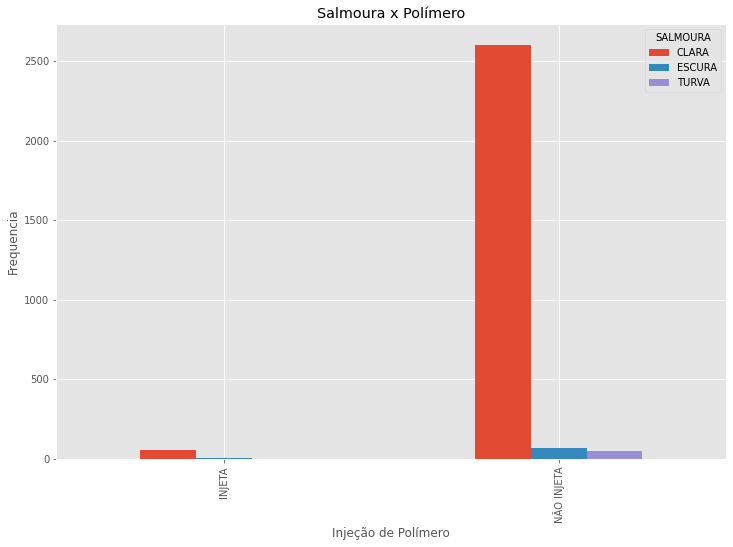

In [8]:
pd.crosstab(dados.POLI, dados.SALMOURA).plot(kind='bar')
plt.title("Salmoura x Polímero")
plt.xlabel('Injeção de Polímero')
plt.ylabel('Frequencia')
plt.show()

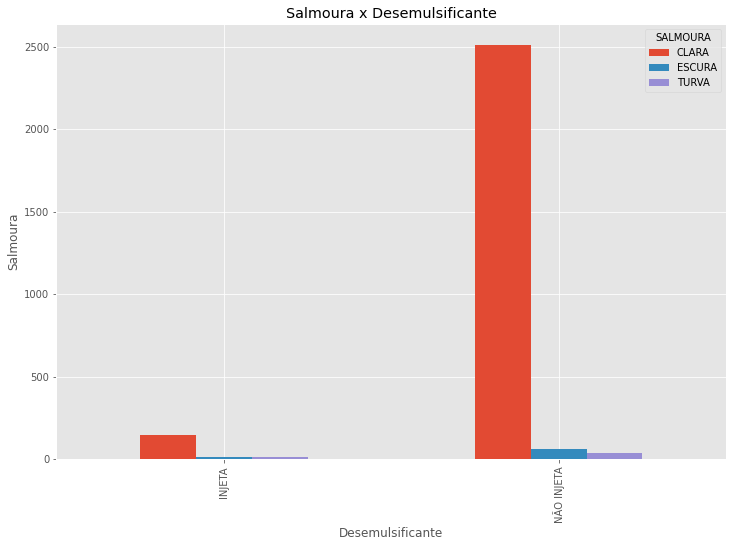

In [9]:
pd.crosstab(dados.DESEM, dados.SALMOURA).plot(kind='bar')
plt.title("Salmoura x Desemulsificante")
plt.xlabel('Desemulsificante')
plt.ylabel('Salmoura')
plt.show()

### Task 3: Encode Categorical Features
---

In [10]:
cat_vars=['POLI','DESEM']
for var in cat_vars:
  cat_list = pd.get_dummies(dados[var], prefix=var)
  dados = dados.join(cat_list)

In [11]:
dados.head()

,SALMOURA,TI20604,TI20605,Carga,Densidade,POLI,DESEM,pH,LIC20506A,LIC20506B,LIC20506C,LIC20506D,PDI20632,PDI20633,PDI20502,PDI20504,POLI_INJETA,POLI_NÃO INJETA,DESEM_INJETA,DESEM_NÃO INJETA
0,CLARA,145.874695,148.884094,24949.935547,0.902689,NÃO INJETA,NÃO INJETA,7.1,42.926491,38.749329,77.448730,76.873009,0.781472,0.807698,1.059472,1.080930,0,1,0,1
1,CLARA,146.338303,148.892502,24876.646484,0.902689,NÃO INJETA,NÃO INJETA,7.2,43.100540,39.073589,77.002838,77.320999,0.793393,0.816901,1.070249,1.004969,0,1,0,1
2,CLARA,147.599106,148.168304,24775.189453,0.896800,NÃO INJETA,NÃO INJETA,7.2,42.924110,38.541901,77.435860,78.679153,0.748093,0.834544,1.092613,1.075542,0,1,0,1
3,CLARA,150.462601,149.011093,24958.574219,0.896800,NÃO INJETA,NÃO INJETA,7.2,43.887329,42.328049,78.217987,72.102509,0.752241,0.801928,1.033532,1.010309,0,1,0,1
4,CLARA,150.590103,149.281693,24831.031250,0.896800,INJETA,NÃO INJETA,7.2,43.889709,42.080090,80.531227,72.069771,0.721580,0.766785,1.018177,0.973402,1,0,0,1


In [12]:
dados['SALMOURA'].value_counts()

CLARA     2658
ESCURA      72
TURVA       51
Name: SALMOURA, dtype: int64

In [13]:
Arraste=[]
for i in range(len(dados['SALMOURA'])):
  if dados['SALMOURA'][i]=='CLARA':
    Arraste.append(0)
  elif dados['SALMOURA'][i]=='TURVA':
    Arraste.append(1)
  else:
    Arraste.append(2)
dados['Arraste']=Arraste

In [14]:
dados.head()

,SALMOURA,TI20604,TI20605,Carga,Densidade,POLI,DESEM,pH,LIC20506A,LIC20506B,...,LIC20506D,PDI20632,PDI20633,PDI20502,PDI20504,POLI_INJETA,POLI_NÃO INJETA,DESEM_INJETA,DESEM_NÃO INJETA,Arraste
0,CLARA,145.874695,148.884094,24949.935547,0.902689,NÃO INJETA,NÃO INJETA,7.1,42.926491,38.749329,...,76.873009,0.781472,0.807698,1.059472,1.080930,0,1,0,1,0
1,CLARA,146.338303,148.892502,24876.646484,0.902689,NÃO INJETA,NÃO INJETA,7.2,43.100540,39.073589,...,77.320999,0.793393,0.816901,1.070249,1.004969,0,1,0,1,0
2,CLARA,147.599106,148.168304,24775.189453,0.896800,NÃO INJETA,NÃO INJETA,7.2,42.924110,38.541901,...,78.679153,0.748093,0.834544,1.092613,1.075542,0,1,0,1,0
3,CLARA,150.462601,149.011093,24958.574219,0.896800,NÃO INJETA,NÃO INJETA,7.2,43.887329,42.328049,...,72.102509,0.752241,0.801928,1.033532,1.010309,0,1,0,1,0
4,CLARA,150.590103,149.281693,24831.031250,0.896800,INJETA,NÃO INJETA,7.2,43.889709,42.080090,...,72.069771,0.721580,0.766785,1.018177,0.973402,1,0,0,1,0


In [15]:
dados.drop(columns=['SALMOURA','POLI','DESEM','DESEM_NÃO INJETA','POLI_NÃO INJETA' ], inplace=True)

In [16]:
dados.head(5)

,TI20604,TI20605,Carga,Densidade,pH,LIC20506A,LIC20506B,LIC20506C,LIC20506D,PDI20632,PDI20633,PDI20502,PDI20504,POLI_INJETA,DESEM_INJETA,Arraste
0,145.874695,148.884094,24949.935547,0.902689,7.1,42.926491,38.749329,77.448730,76.873009,0.781472,0.807698,1.059472,1.080930,0,0,0
1,146.338303,148.892502,24876.646484,0.902689,7.2,43.100540,39.073589,77.002838,77.320999,0.793393,0.816901,1.070249,1.004969,0,0,0
2,147.599106,148.168304,24775.189453,0.896800,7.2,42.924110,38.541901,77.435860,78.679153,0.748093,0.834544,1.092613,1.075542,0,0,0
3,150.462601,149.011093,24958.574219,0.896800,7.2,43.887329,42.328049,78.217987,72.102509,0.752241,0.801928,1.033532,1.010309,0,0,0
4,150.590103,149.281693,24831.031250,0.896800,7.2,43.889709,42.080090,80.531227,72.069771,0.721580,0.766785,1.018177,0.973402,1,0,0


### Task 4: Visualize Class Imbalance
---

In [17]:
from yellowbrick.target import ClassBalance
plt.style.use("ggplot")
plt.rcParams['figure.figsize'] = (12,8)

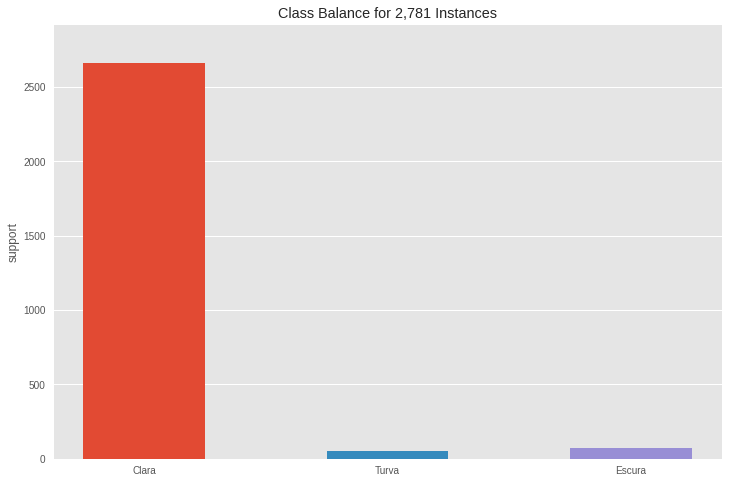

In [18]:
visualizer=ClassBalance(labels=['Clara','Turva','Escura']).fit(dados.Arraste)
visualizer.show()

## Conclusão: Modelo bastante desbalanceado. Utilizaremos técnica de sobre/sub-amostragem

### Técnicas de Sobre/Sub-Amostragem

In [19]:
!pip install imblearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [20]:
X = dados.loc[:, dados.columns != 'Arraste']
y = dados.Arraste

In [21]:
y.value_counts()

0    2658
2      72
1      51
Name: Arraste, dtype: int64

In [22]:
from imblearn.combine import SMOTETomek

smtom = SMOTETomek(sampling_strategy='all')
x_smtm, y_smtm = smtom.fit_resample(X, y)

y_smtm.value_counts()

1    2559
2    2554
0    2525
Name: Arraste, dtype: int64

In [23]:
x_smtm.shape

(7638, 15)

In [24]:
y_smtm.shape

(7638,)

### Separação dos conjutos teste/treino
---

In [25]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x_smtm, y_smtm, test_size=0.3)

Criação de Modelos

In [26]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz # display the tree within a Jupyter notebook
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from ipywidgets import interactive, IntSlider, FloatSlider, interact
import ipywidgets
from IPython.display import Image
from subprocess import call
import matplotlib.image as mpimg
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import ClassificationReport

Função Matriz Confusão

In [27]:
from sklearn.metrics import confusion_matrix as cm
from sklearn.metrics import ConfusionMatrixDisplay
plt.rcParams['figure.figsize']=[16,9]

## Ajuste: Árvore de Decisão

In [28]:
parameters = {'criterion': ['gini', 'entropy'],
     'splitter': ['best', 'random'],
     'max_depth': [2*n for n in range(1,10)],
     'max_features': ['auto', 'sqrt'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10]}

tree = DecisionTreeClassifier()

In [29]:
tree_cv=GridSearchCV(estimator=DecisionTreeClassifier(),param_grid=parameters,cv=10)
tree_cv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']})

In [30]:
print("melhores hiperparâmetros: ",tree_cv.best_params_)
print("acurácia :",tree_cv.best_score_)

melhores hiperparâmetros:  {'criterion': 'entropy', 'max_depth': 18, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}
acurácia : 0.9367720256221779


In [31]:
tree_cv.score(X_test,y_test)

0.9380453752181501

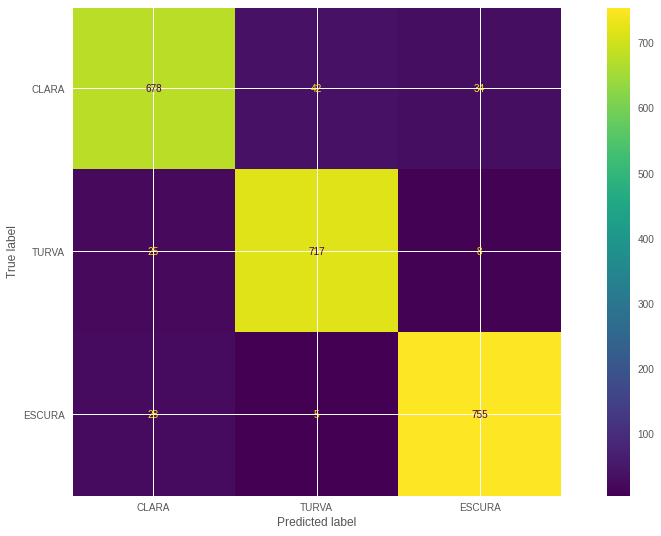

In [32]:
y_predtree=tree_cv.predict(X_test)
mc_tree=cm(y_test, y_predtree)
mcdtree=ConfusionMatrixDisplay(mc_tree, display_labels=['CLARA','TURVA','ESCURA'])
mcdtree.plot()


In [33]:
plt.rcParams['figure.figsize'] = (12,8)
plt.style.use("ggplot")

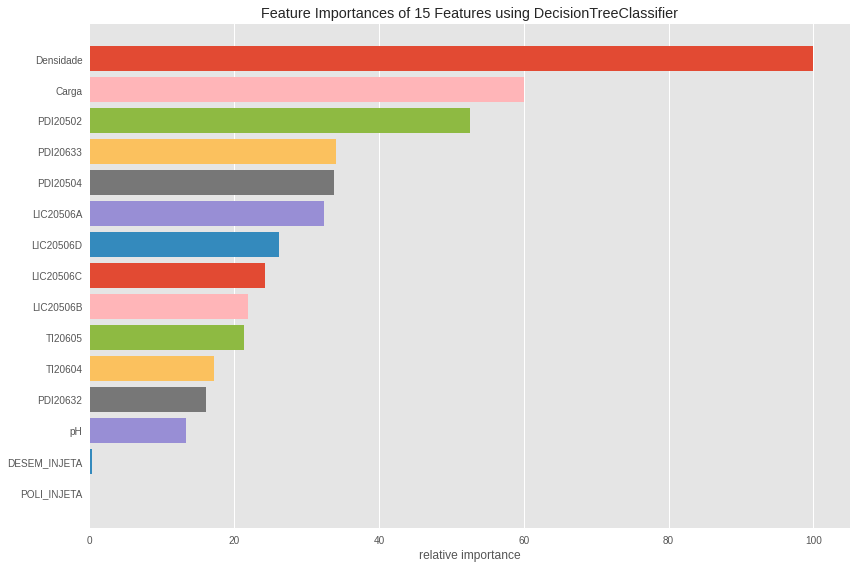

In [34]:
dt=DecisionTreeClassifier(max_depth=18, random_state=0)
viz=FeatureImportances(dt)
viz.fit(X_train,y_train)
viz.show()

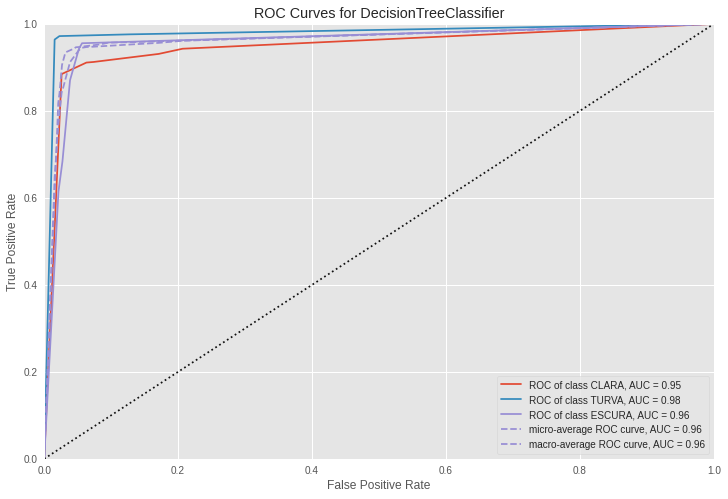

In [35]:
visualizer= ROCAUC(dt, classes=['CLARA','TURVA','ESCURA'])

visualizer.fit(X_train, y_train)

visualizer.score(X_test, y_test)

visualizer.poof();

## Ajuste Regressão Logística

In [36]:
parameters ={'C':[0.01,0.1,1],
             'penalty':['l2'],
             'solver':['lbfgs']}

In [37]:
parameters ={"C":[0.01,0.1,1],'penalty':['l2'], 'solver':['lbfgs']}# l1 lasso l2 ridge
lr=LogisticRegression()
logreg_cv=GridSearchCV(estimator=LogisticRegression(),param_grid=parameters,cv=10)
logreg_cv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l2'],
                         'solver': ['lbfgs']})

In [38]:
print("Hiperparâmetros: ",logreg_cv.best_params_)
print("Acurácia :",logreg_cv.best_score_)

Hiperparâmetros:  {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
Acurácia : 0.49382512513563653


In [39]:
logreg_cv.score(X_test,y_test)

0.5047993019197208

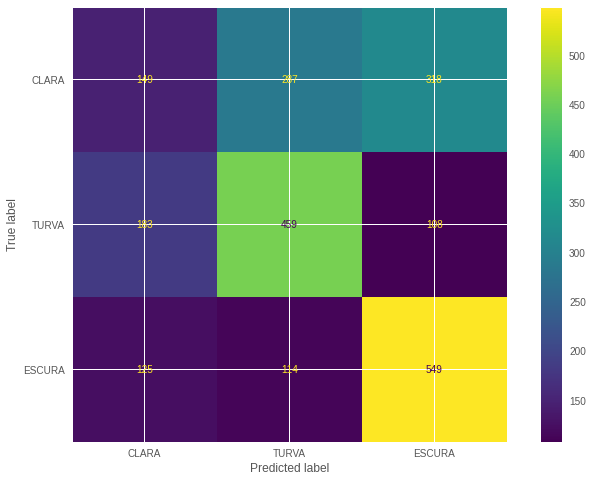

In [40]:
y_predlog=logreg_cv.predict(X_test)
mc_log=cm(y_test, y_predlog)
mcdlog=ConfusionMatrixDisplay(mc_log, display_labels=['CLARA','TURVA','ESCURA'])
mcdlog.plot()

## K-Nearest Neighbours

In [41]:
parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'p': [1,2]}

KNN = KNeighborsClassifier()

In [42]:
knn_cv=GridSearchCV(estimator=KNeighborsClassifier(),param_grid=parameters,cv=10)
knn_cv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'p': [1, 2]})

In [43]:
print("Melhores hiperparâmetros ",knn_cv.best_params_)
print("Acurácia :",knn_cv.best_score_)

Melhores hiperparâmetros  {'algorithm': 'auto', 'n_neighbors': 1, 'p': 1}
Acurácia : 0.8986198326857784


In [44]:
knn_cv.score(X_test,y_test)

0.9053228621291448

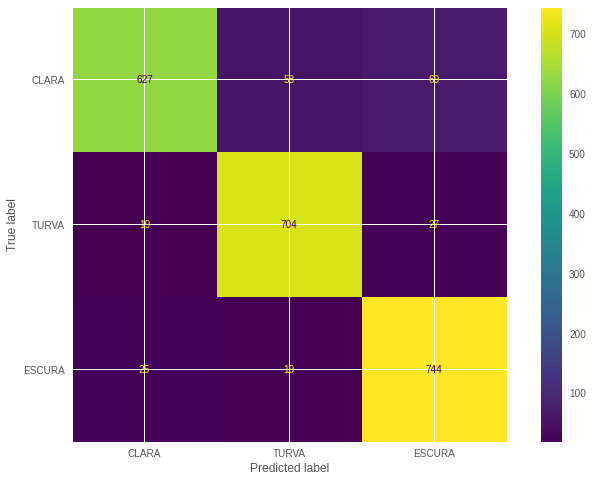

In [45]:
y_predknn=knn_cv.predict(X_test)
mc_knn=cm(y_test, y_predknn)
mcdknn=ConfusionMatrixDisplay(mc_knn, display_labels=['CLARA','TURVA','ESCURA'])
mcdknn.plot()

## Ajuste: Random Forest

In [46]:
RF = RandomForestClassifier()
RF.fit(X_train,y_train)

RandomForestClassifier()

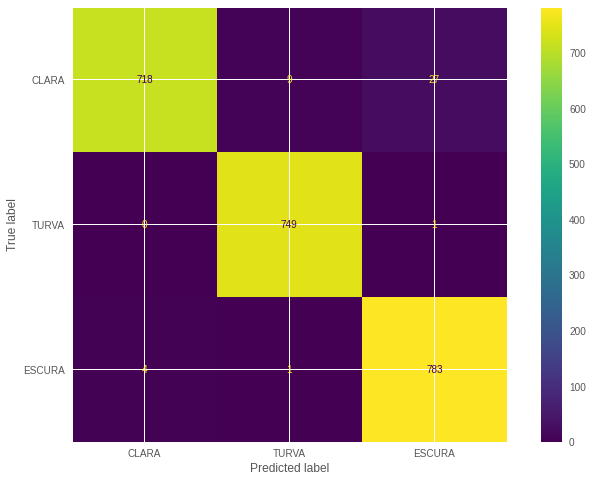

In [47]:
y_predRF=RF.predict(X_test)
mc_RF=cm(y_test, y_predRF)
mcdRF=ConfusionMatrixDisplay(mc_RF, display_labels=['CLARA','TURVA','ESCURA'])
mcdRF.plot()

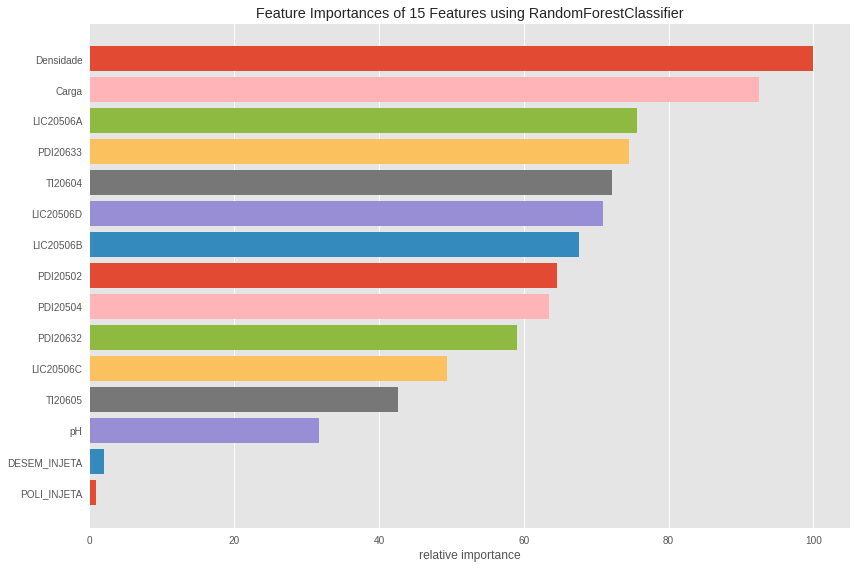

In [48]:
viz=FeatureImportances(RF)
viz.fit(X_train,y_train)
viz.show()

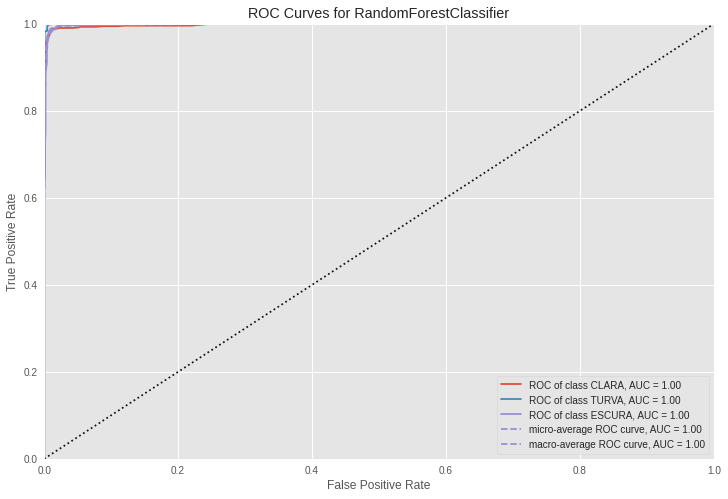

In [49]:
visualizer= ROCAUC(RF, classes=['CLARA','TURVA','ESCURA'])

visualizer.fit(X_train, y_train)

visualizer.score(X_test, y_test)

visualizer.poof();

In [50]:
Xreal = dados.loc[:, dados.columns != 'Arraste']
yreal = dados.Arraste

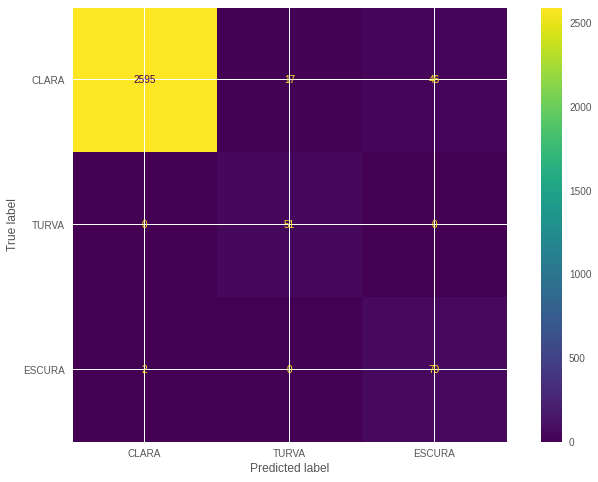

In [51]:
y_predrealRF=RF.predict(Xreal)
mc_realRF=cm(yreal, y_predrealRF)
mcdrealRF=ConfusionMatrixDisplay(mc_realRF, display_labels=['CLARA','TURVA','ESCURA'])
mcdrealRF.plot()

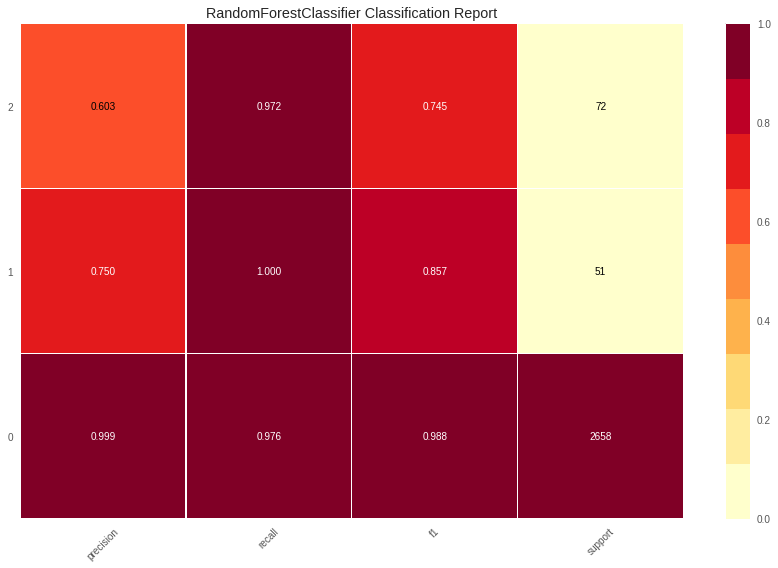

In [52]:
clr = ClassificationReport(RF, support=True)
clr.fit(X_train, y_train)
clr.score(Xreal, yreal)
clr.show()

## Novidade: Melhorando o RF

In [53]:
from sklearn.model_selection import KFold
crossvalidation=KFold(n_splits=5, shuffle=True, random_state=1)
scorer='accuracy'

In [54]:
max_features=[X.shape[1]/3, 'sqrt','log2','auto']
min_samples_leaf=[1,10,30]
n_estimators=[50,100,300]

In [61]:
search_grid= {'n_estimators':n_estimators,'max_features': max_features,'min_samples_leaf':min_samples_leaf}
melhor_modelo=GridSearchCV(estimator=RF,
                         param_grid=search_grid,
                         scoring=scorer,
                         cv=crossvalidation)
melhor_modelo.fit(Xreal,yreal)
best_params=melhor_modelo.best_params_
best_score=melhor_modelo.best_score_
print('Melhores parâmetros: %s'% best_params)
print('Melhor acurácia: %s'% best_score)

Melhores parâmetros: {'max_features': 'sqrt', 'min_samples_leaf': 1, 'n_estimators': 300}
Melhor acurácia: 0.9572084522687057


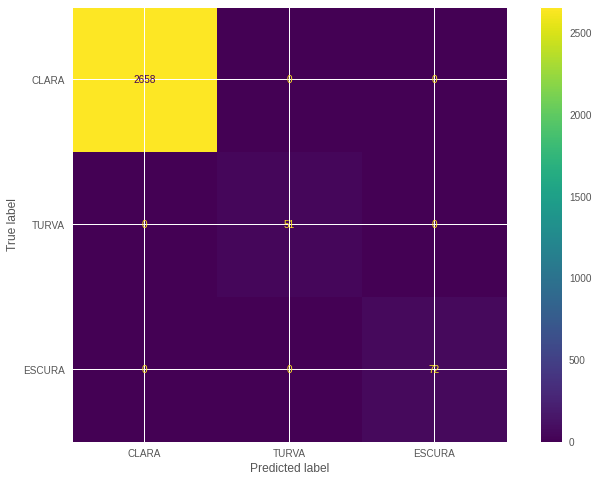

In [62]:
y_predrealRF=melhor_modelo.predict(Xreal)
mc_realRF=cm(yreal, y_predrealRF)
mcdrealRF=ConfusionMatrixDisplay(mc_realRF, display_labels=['CLARA','TURVA','ESCURA'])
mcdrealRF.plot()

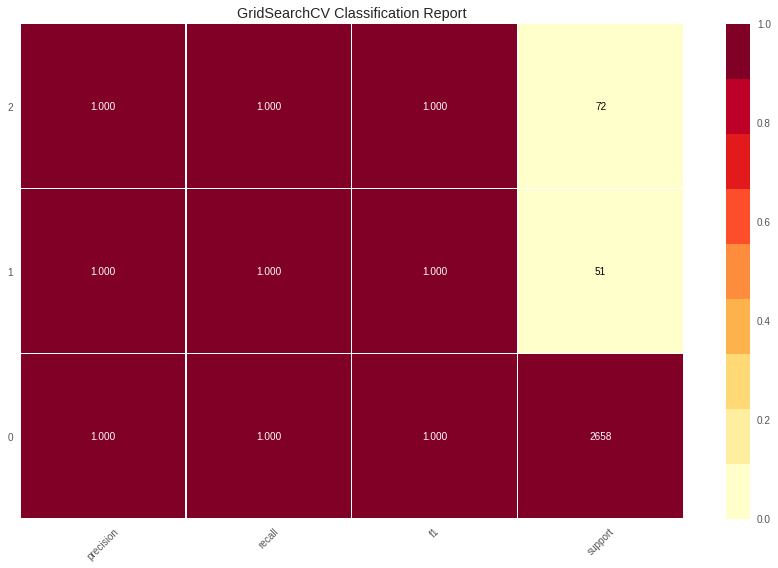

In [63]:
clr = ClassificationReport(melhor_modelo, support=True)
clr.fit(X_train, y_train)
clr.score(Xreal, yreal)
clr.show()

In [64]:
# salvar modelo
import pickle
# salvar o modelo RandomForest (RF) no arquivo dessalgadora.pkl
with open('dessalgadora.pkl', 'wb') as file:
    pickle.dump(melhor_modelo, file)